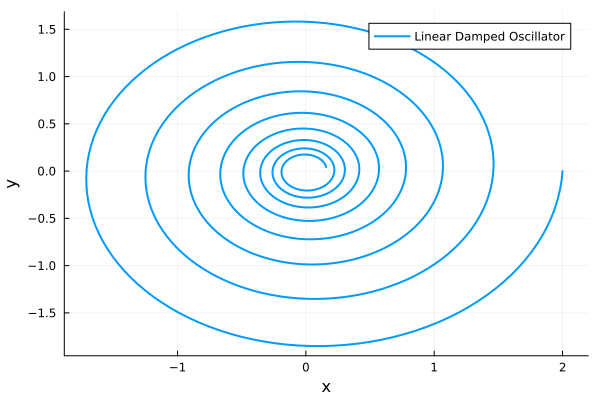

In [19]:
using DifferentialEquations
using Plots

function linear_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1] + 2u[2]
    du[2] = - 2u[1] - 0.1u[2]
end

# Initial conditions
u0_linear = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for linear damped oscillator
prob_linear = ODEProblem(linear_damped_oscillator!, u0_linear, tspan)
sol_linear = solve(prob_linear)

# Plot the results
plot(sol_linear, vars=(1, 2), xlabel="x", ylabel="y", label="Linear Damped Oscillator", linewidth=2)

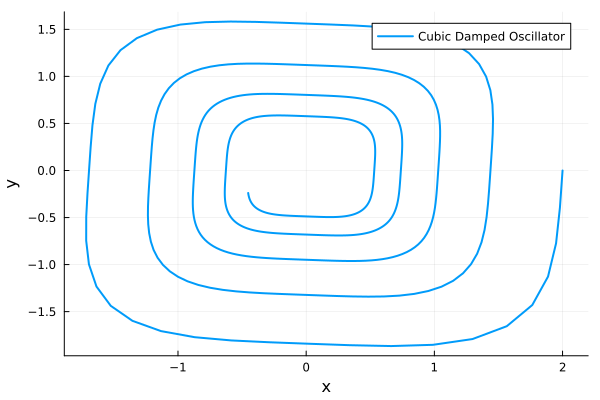

In [20]:
function cubic_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1]^3 + 2u[2]^3
    du[2] = - 2u[1]^3 - 0.1u[2]^3
end

# Initial conditions
u0_cubic = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for cubic damped oscillator
prob_cubic = ODEProblem(cubic_damped_oscillator!, u0_cubic, tspan)
sol_cubic = solve(prob_cubic)

# Plot the results
plot(sol_cubic, vars=(1, 2), xlabel="x", ylabel="y", label="Cubic Damped Oscillator", linewidth=2)

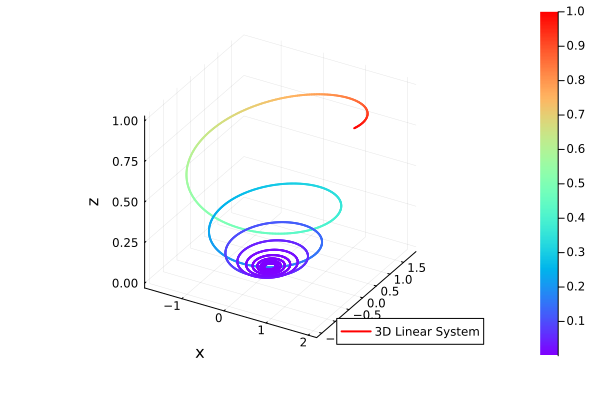

In [21]:
function linear_3d_system!(du, u, p, t)
    du[1] = -0.1u[1] - 2u[2]
    du[2] = 2u[1] - 0.1u[2]
    du[3] = -0.3u[3]
end

# Initial conditions
u0_3d_linear = [2.0, 0.0, 1.0]

# Time span
tspan = (0.0, 30.0)

# Solve ODE for three-dimensional linear system
prob_3d_linear = ODEProblem(linear_3d_system!, u0_3d_linear, tspan)
sol_3d_linear = solve(prob_3d_linear, saveat=0.01)

line_z = sol_3d_linear[3, :]
# Plot the results
plot(sol_3d_linear, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="3D Linear System", linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


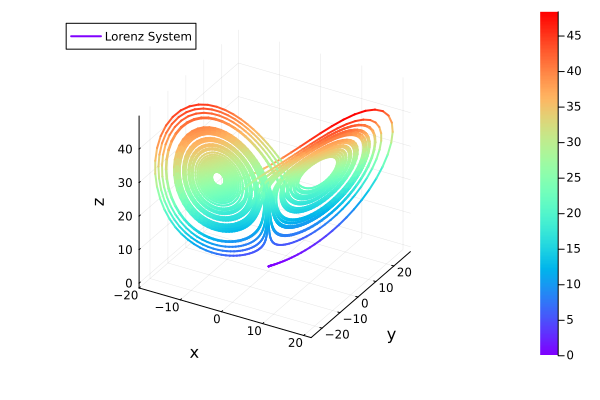

In [17]:
using DifferentialEquations
using Plots

function lorenz!(du, u, p, t)
    σ, ρ, β = p
    du[1] = σ * (u[2] - u[1])
    du[2] = u[1] * (ρ - u[3]) - u[2]
    du[3] = u[1] * u[2] - β * u[3]
end

# Initial conditions and common parameters for the Lorenz System
u0 = [0.1, 0.0, 0.0]
p = [10.0, 28.0, 8/3]

# Time span
tspan = (0.0, 60.0) 

# Solve the differential equations
prob = ODEProblem(lorenz!, u0, tspan, p)
sol = solve(prob, Tsit5(), saveat=0.01)  # Reduce the number of data points

# Create an array for line_z representing time
line_z = sol[3, :]

# Plot the results with rainbow gradient
plot(sol, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="Lorenz System",
     linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)


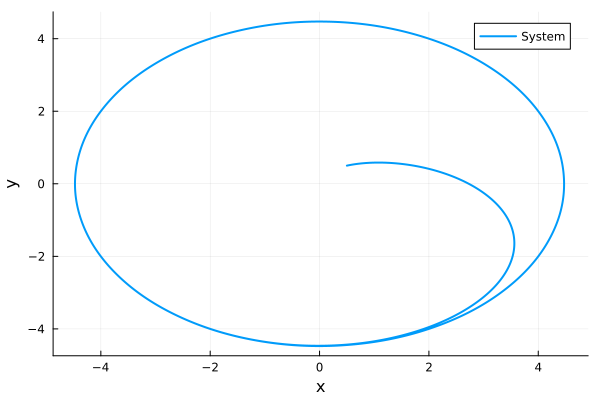

In [23]:
using DifferentialEquations
using Plots

function system!(du, u, p, t)
    μ, ω, A = p
    du[1] = μ * u[1] + ω * u[2] - A * u[1] * (u[1]^2 + u[2]^2)
    du[2] = -ω * u[1] + μ * u[2] - A * u[2] * (u[1]^2 + u[2]^2)
end

# Condições iniciais e parâmetros comuns para o sistema
u0 = [0.5, 0.5]
p = [2.0, 1.0, 0.1]  # μ, ω, A

# Intervalo de tempo
tspan = (0.0, 10.0)

# Resolver as equações diferenciais
prob = ODEProblem(system!, u0, tspan, p)
sol = solve(prob)

# Plotar os resultados
plot(sol, vars=(1, 2), xlabel="x", ylabel="y", label="System", linewidth=2)

In [16]:
using Combinatorics

function generate_theta(X)
    n, p = size(X)
    combinations = []
    for i in 1:p
        push!(combinations, X[:, i])
        push!(combinations, X[:, i].^2)
        push!(combinations, X[:, i].^3)
        push!(combinations, X[:, i].^4)
        push!(combinations, X[:, i].^5)
    end
    for i in 1:p-1
        for j in i+1:p
            push!(combinations, X[:, i] .* X[:, j])
        end
    end
    for i in 1:p-2
        for j in i+1:p-1
            for k in j+1:p
                push!(combinations, X[:, i] .* X[:, j] .* X[:, k])
            end
        end
    end
    return hcat(combinations...)
end

# Example usage
X = [1 3 5; 2 4 6]  # Replace x1, x2, x3 with actual values
theta_matrix = generate_theta(X)

# Print the matrix
println(theta_matrix)


[1 1 1 1 1 3 9 27 81 243 5 25 125 625 3125 3 5 15 15; 2 4 8 16 32 4 16 64 256 1024 6 36 216 1296 7776 8 12 24 48]


In [30]:
# Extrair os valores da solução
σ, ρ, β = p
t_values = sol.t
dxdt_values = [σ * (sol[2, i] - sol[1, i]) for i in 1:length(t_values)]
dydt_values = [sol[1, i] * (ρ - sol[3, i]) - sol[2, i] for i in 1:length(t_values)]
dzdt_values = [sol[1, i] * sol[2, i] - β * sol[3, i] for i in 1:length(t_values)]

x_values = sol[1, :]
y_values = sol[2, :]
z_values = sol[3, :]

X_dot = hcat(dxdt_values, dydt_values, dzdt_values)
X = hcat(x_values, y_values, z_values)

theta_matrix = generate_theta(X)

using JuMP, Ipopt
λ = 0.1
m = Model(Ipopt.Optimizer)

# Corrigir a definição da variável ξ
@variable(m, ξ[1:length(theta_matrix[1,:]), 1:3])
@variable(m, t[1:length(theta_matrix[1,:]), 1:3])

# Adicionar restrições epigráficas
@constraint(m, ξ .<= t)
@constraint(m, -ξ .<= t)

@objective(m, Min, sum((X_dot - theta_matrix*ξ).^2) + λ * sum(t[i, j] for i in 1:length(theta_matrix[1,:]), j in 1:3))
optimize!(m)
println(m)
ξ_values = value.(ξ)

This is Ipopt version 3.14.13, running with linear solver MUMPS 5.6.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:      228
Number of nonzeros in Lagrangian Hessian.............:      570

Total number of variables............................:      114
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      114
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:      114

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.3606934e+07 0.00e+00 1.04e+04  -1.0 0.00e+00    -  0.00e+00 0.00e+00 


Subject to
 ξ[1,1] - t[1,1] <= 0
 ξ[2,1] - t[2,1] <= 0
 ξ[3,1] - t[3,1] <= 0
 ξ[4,1] - t[4,1] <= 0
 ξ[5,1] - t[5,1] <= 0
 ξ[6,1] - t[6,1] <= 0
 ξ[7,1] - t[7,1] <= 0
 ξ[8,1] - t[8,1] <= 0
 ξ[9,1] - t[9,1] <= 0
 ξ[10,1] - t[10,1] <= 0
 ξ[11,1] - t[11,1] <= 0
 ξ[12,1] - t[12,1] <= 0
 ξ[13,1] - t[13,1] <= 0
 ξ[14,1] - t[14,1] <= 0
 ξ[15,1] - t[15,1] <= 0
 ξ[16,1] - t[16,1] <= 0
 ξ[17,1] - t[17,1] <= 0
 ξ[18,1] - t[18,1] <= 0
 ξ[19,1] - t[19,1] <= 0
 ξ[1,2] - t[1,2] <= 0
 ξ[2,2] - t[2,2] <= 0
 ξ[3,2] - t[3,2] <= 0
 ξ[4,2] - t[4,2] <= 0
 ξ[5,2] - t[5,2] <= 0
 ξ[6,2] - t[6,2] <= 0
 ξ[7,2] - t[7,2] <= 0
 ξ[8,2] - t[8,2] <= 0
 ξ[9,2] - t[9,2] <= 0
 ξ[10,2] - t[10,2] <= 0
 ξ[11,2] - t[11,2] <= 0
 ξ[12,2] - t[12,2] <= 0
 ξ[13,2] - t[13,2] <= 0
 ξ[14,2] - t[14,2] <= 0
 ξ[15,2] - t[15,2] <= 0
 ξ[16,2] - t[16,2] <= 0
 ξ[17,2] - t[17,2] <= 0
 ξ[18,2] - t[18,2] <= 0
 ξ[19,2] - t[19,2] <= 0
 ξ[1,3] - t[1,3] <= 0
 ξ[2,3] - t[2,3] <= 0
 ξ[3,3] - t[3,3] <= 0
 ξ[4,3] - t[4,3] <= 0
 ξ[5,3] - t[5,3] <= 0
 ξ

19×3 Matrix{Float64}:
 -9.99982      27.9998        0.000127421
  4.26699e-6   -2.7802e-6     5.1165e-6
  5.66713e-7   -5.56847e-7    3.99032e-7
  1.47967e-8   -1.19999e-8    6.94316e-9
 -5.70365e-10   5.60571e-10  -4.43343e-10
  9.99993      -0.999929     -5.02043e-5
  2.56421e-7    1.43448e-7    1.15317e-6
 -1.1342e-7     1.10602e-7   -8.16688e-8
 -9.26797e-10   6.79091e-10  -4.86991e-10
  9.25103e-11  -8.93044e-11   7.02095e-11
 -2.20192e-5    1.61655e-5   -2.66661
  2.77141e-6   -1.96124e-6   -1.0126e-5
 -1.10722e-7    7.45883e-8    6.13695e-7
  1.77261e-9   -1.12265e-9   -1.56556e-8
 -1.69999e-11   1.08322e-11   1.35369e-10
 -1.11516e-6   -2.44607e-7    0.999995
 -6.49825e-6   -0.999994     -4.49367e-6
  1.25532e-6   -1.24288e-6    9.27809e-7
 -1.30785e-7    1.1579e-7    -2.78707e-8

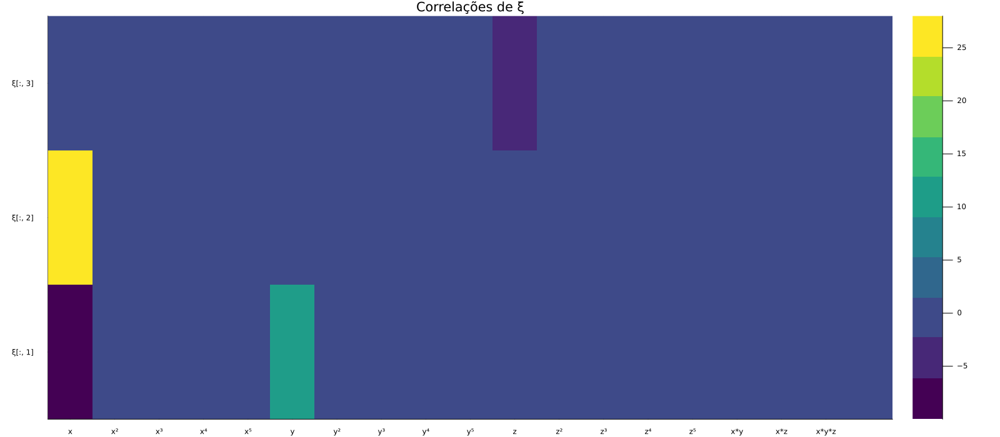

In [72]:
using Plots

# Plotar a esparsidade de ξ
function plot_sparsity(ξ_matrix, column_labels)
    p = heatmap(ξ_matrix', c=cgrad(:viridis, 10, categorical = true), xlabel="", ylabel="Colunas de ξ", yticks=1:size(ξ_matrix, 2), title=["Correlações de ξ" "ξ[:, 2]"], size=(1600, 700))

    # Adicionar rótulos às colunas
    xticks!(1:length(column_labels), column_labels)
    # Adicionar rótulos às linhas
    yticks!(1:size(ξ_matrix, 2), ["ξ[:, $i]" for i in 1:size(ξ_matrix, 2)])
    
    return p
end

plot_sparsity(ξ_values,["x", "x²", "x³","x⁴", "x⁵","y", "y²", "y³", "y⁴", "y⁵", "z", "z²", "z³", "z⁴", "z⁵", "x*y", "x*z", "x*y*z"])


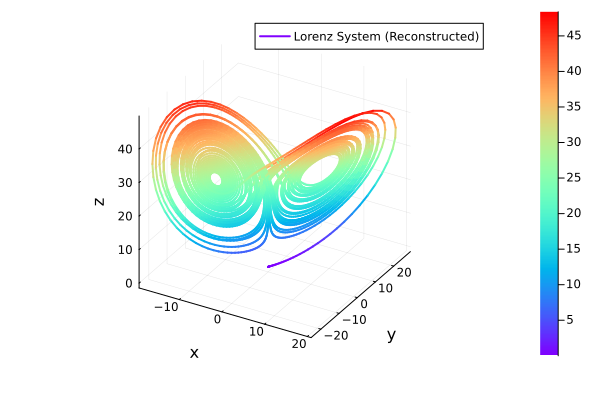

In [27]:
# Extrair as derivadas reconstruídas
xyz_dot_reconstructed = theta_matrix * ξ_values
x_dot_reconstructed = xyz_dot_reconstructed[:, 1]
y_dot_reconstructed = xyz_dot_reconstructed[:, 2]
z_dot_reconstructed = xyz_dot_reconstructed[:, 3]

# Integrar numericamente para obter as variáveis originais
x_reconstructed = cumsum(x_dot_reconstructed) * (t_values[2] - t_values[1])
y_reconstructed = cumsum(y_dot_reconstructed) * (t_values[2] - t_values[1])
z_reconstructed = cumsum(z_dot_reconstructed) * (t_values[2] - t_values[1])

plot(x_reconstructed, y_reconstructed, z_reconstructed, 
     xlabel="x", ylabel="y", zlabel="z", 
     label="Lorenz System (Reconstructed)", 
     linewidth=2, linecolor=:auto, color=:rainbow1, legend=:topright, line_z=z_reconstructed)

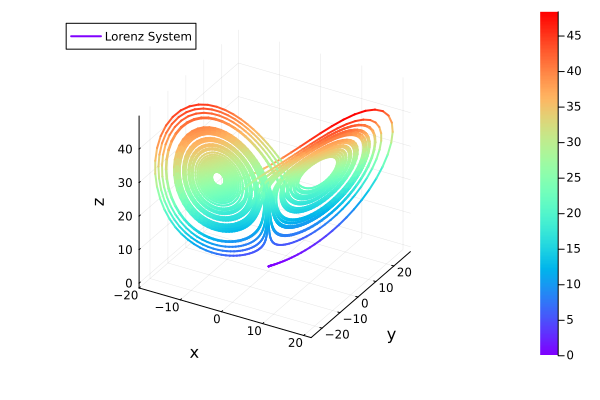

In [76]:
plot(sol, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="Lorenz System",
     linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)